<a href="https://www.kaggle.com/code/tauhidulislamtopu/decisiontree?scriptVersionId=276904794" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve

In [2]:
from ydata_profiling import ProfileReport

In [3]:
df=pd.read_csv('/kaggle/input/winlabcsv/winequality_red.csv')

In [4]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 107.31it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
x=df.drop(columns='quality')

In [8]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y=df['quality']

In [10]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [11]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.40, random_state=500)

In [12]:
dt_model = DecisionTreeClassifier()

In [13]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [14]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(0.5407774390243902, 0.9736842105263158, 'x[10] <= 10.55\ngini = 0.638\nsamples = 959\nvalue = [7, 30, 407, 392, 111, 12]'),
 Text(0.3606674178154825, 0.9210526315789473, 'x[6] <= 95.5\ngini = 0.544\nsamples = 598\nvalue = [5, 21, 345, 208, 17, 2]'),
 Text(0.19429347826086957, 0.868421052631579, 'x[9] <= 0.525\ngini = 0.567\nsamples = 530\nvalue = [5, 21, 283, 202, 17, 2]'),
 Text(0.02392629904559915, 0.8157894736842105, 'x[7] <= 0.994\ngini = 0.429\nsamples = 102\nvalue = [1, 11, 75, 14, 1, 0]'),
 Text(0.019684517497348886, 0.7631578947368421, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.028168080593849416, 0.7631578947368421, 'x[10] <= 9.15\ngini = 0.399\nsamples = 99\nvalue = [1, 8, 75, 14, 1, 0]'),
 Text(0.008483563096500531, 0.7105263157894737, 'x[2] <= 0.245\ngini = 0.611\nsamples = 6\nvalue = [0, 3, 1, 2, 0, 0]'),
 Text(0.0042417815482502655, 0.6578947368421053, 'gini = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.012725344644750796, 0.65789473

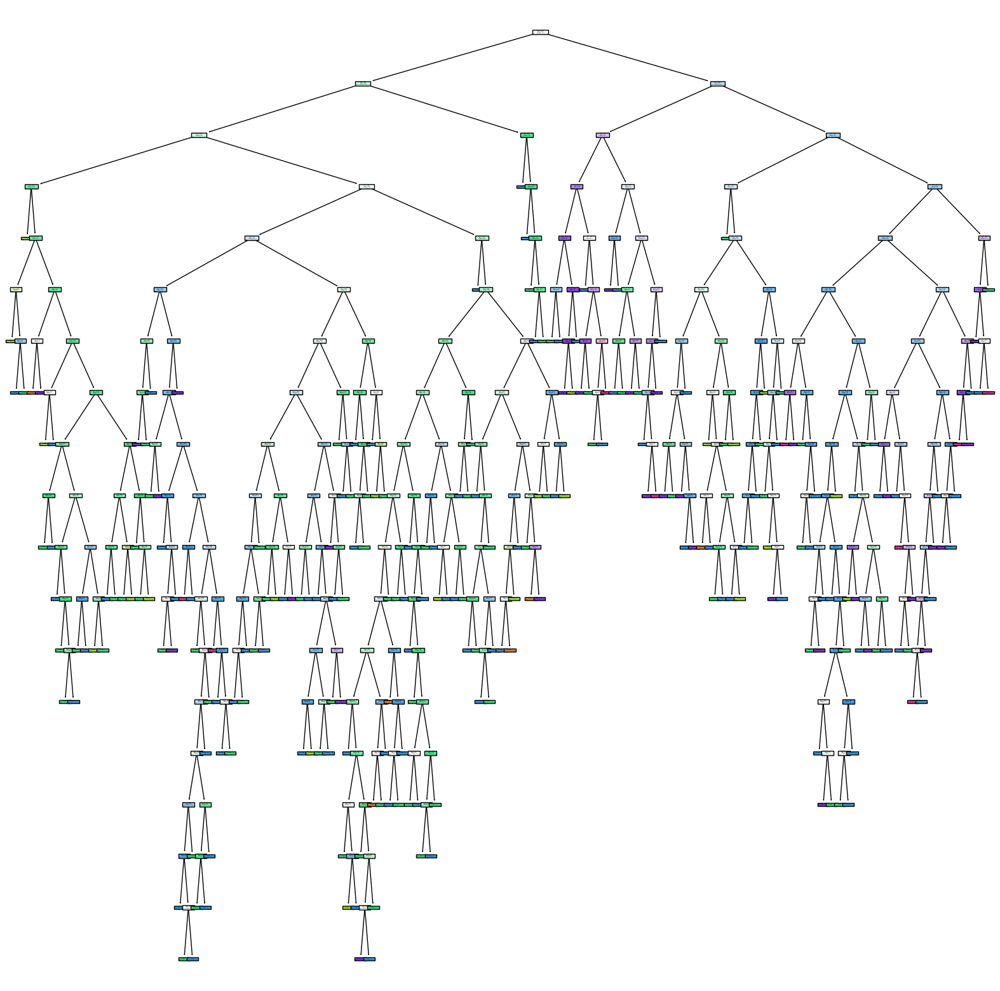

In [15]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [16]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [17]:
df1=df.head(500)

In [18]:
x1=df1.drop(columns='quality')

In [19]:
y1=df1.quality

In [20]:
dt_model1=DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

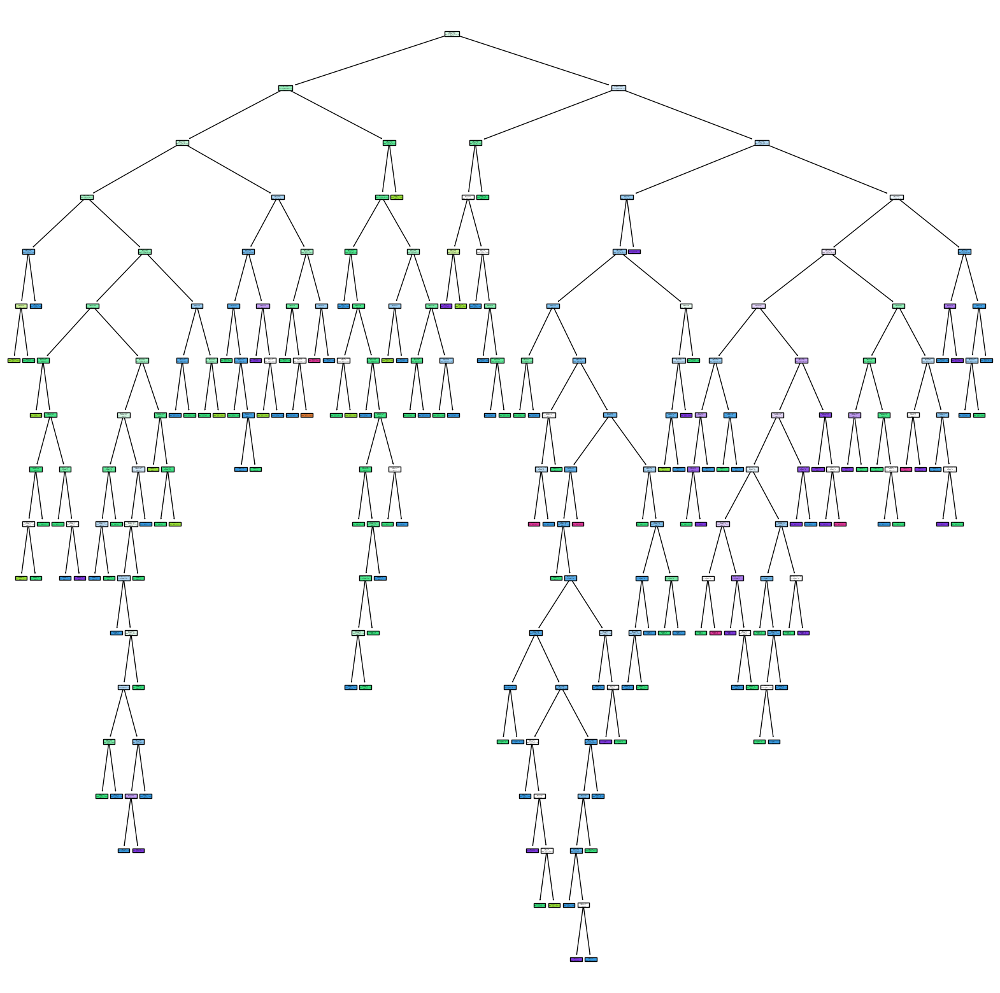

In [21]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True,class_names=[str(i) for i in set(y1)],feature_names=x1.columns)
plt.savefig("dt_model_1")

In [22]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [23]:
[str(i) for i in set(y1)]

['3', '4', '5', '6', '7', '8']

In [24]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [25]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [26]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [27]:
dt_model1.score(x1,y1)

1.0

In [28]:
dt_model1.score(x_test,y_test)

0.60625

In [29]:
path=dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha=path['ccp_alphas']

In [30]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.00285714, 0.003     , 0.003     , 0.003     ,
       0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
       0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
       0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
       0.00363636, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
       0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
       0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
       0.00589394, 0.00656364, 0.00671079, 0.0067591 , 0.00688

In [31]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [32]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 Deci

Text(0, 0.5, 'score')

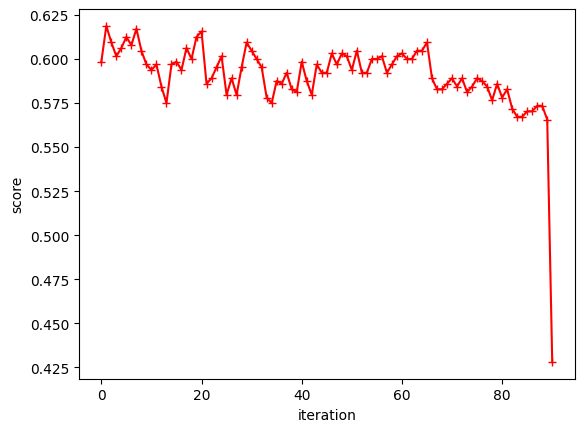

In [33]:
dt_model2=[]
score=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test,y_test))

plt.plot(score,'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [34]:
train_score=[i.score(x1,y1) for i in dt_model2]

In [35]:
test_score=[i.score(x_test, y_test) for i in dt_model2]

In [36]:
train_score

[1.0,
 0.998,
 0.994,
 0.992,
 0.992,
 0.99,
 0.986,
 0.984,
 0.96,
 0.962,
 0.962,
 0.962,
 0.96,
 0.962,
 0.964,
 0.962,
 0.962,
 0.962,
 0.964,
 0.954,
 0.95,
 0.928,
 0.932,
 0.934,
 0.932,
 0.928,
 0.932,
 0.93,
 0.932,
 0.932,
 0.924,
 0.924,
 0.914,
 0.912,
 0.912,
 0.914,
 0.914,
 0.91,
 0.91,
 0.906,
 0.906,
 0.896,
 0.896,
 0.896,
 0.898,
 0.888,
 0.886,
 0.886,
 0.884,
 0.88,
 0.876,
 0.874,
 0.87,
 0.858,
 0.86,
 0.858,
 0.858,
 0.846,
 0.842,
 0.848,
 0.834,
 0.828,
 0.814,
 0.824,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.636,
 0.596,
 0.596,
 0.558,
 0.478]

In [37]:
test_score

[0.5984375,
 0.61875,
 0.609375,
 0.6015625,
 0.60625,
 0.6125,
 0.6078125,
 0.6171875,
 0.6046875,
 0.596875,
 0.59375,
 0.596875,
 0.584375,
 0.575,
 0.596875,
 0.5984375,
 0.59375,
 0.60625,
 0.6,
 0.6125,
 0.615625,
 0.5859375,
 0.5890625,
 0.5953125,
 0.6015625,
 0.5796875,
 0.5890625,
 0.5796875,
 0.5953125,
 0.609375,
 0.6046875,
 0.6,
 0.5953125,
 0.578125,
 0.575,
 0.5875,
 0.5859375,
 0.5921875,
 0.5828125,
 0.58125,
 0.5984375,
 0.5875,
 0.5796875,
 0.596875,
 0.5921875,
 0.5921875,
 0.603125,
 0.596875,
 0.603125,
 0.6015625,
 0.59375,
 0.6046875,
 0.5921875,
 0.5921875,
 0.6,
 0.6,
 0.6015625,
 0.5921875,
 0.596875,
 0.6015625,
 0.603125,
 0.6,
 0.6,
 0.6046875,
 0.6046875,
 0.609375,
 0.5890625,
 0.5828125,
 0.5828125,
 0.5859375,
 0.5890625,
 0.584375,
 0.5890625,
 0.58125,
 0.584375,
 0.5890625,
 0.5875,
 0.584375,
 0.5765625,
 0.5859375,
 0.578125,
 0.5828125,
 0.571875,
 0.5671875,
 0.5671875,
 0.5703125,
 0.5703125,
 0.5734375,
 0.5734375,
 0.565625,
 0.428125]

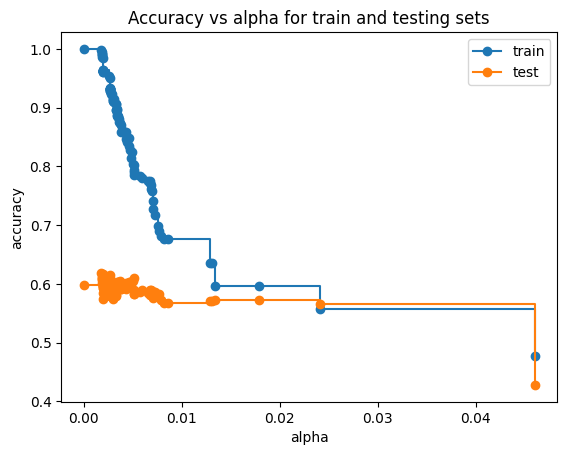

In [38]:
fig,ax=plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for train and testing sets")
ax.plot(ccp_alpha,train_score,marker='o',label='train',drawstyle='steps-post')
ax.plot(ccp_alpha,test_score,marker='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

In [39]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'x[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'x[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'x[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

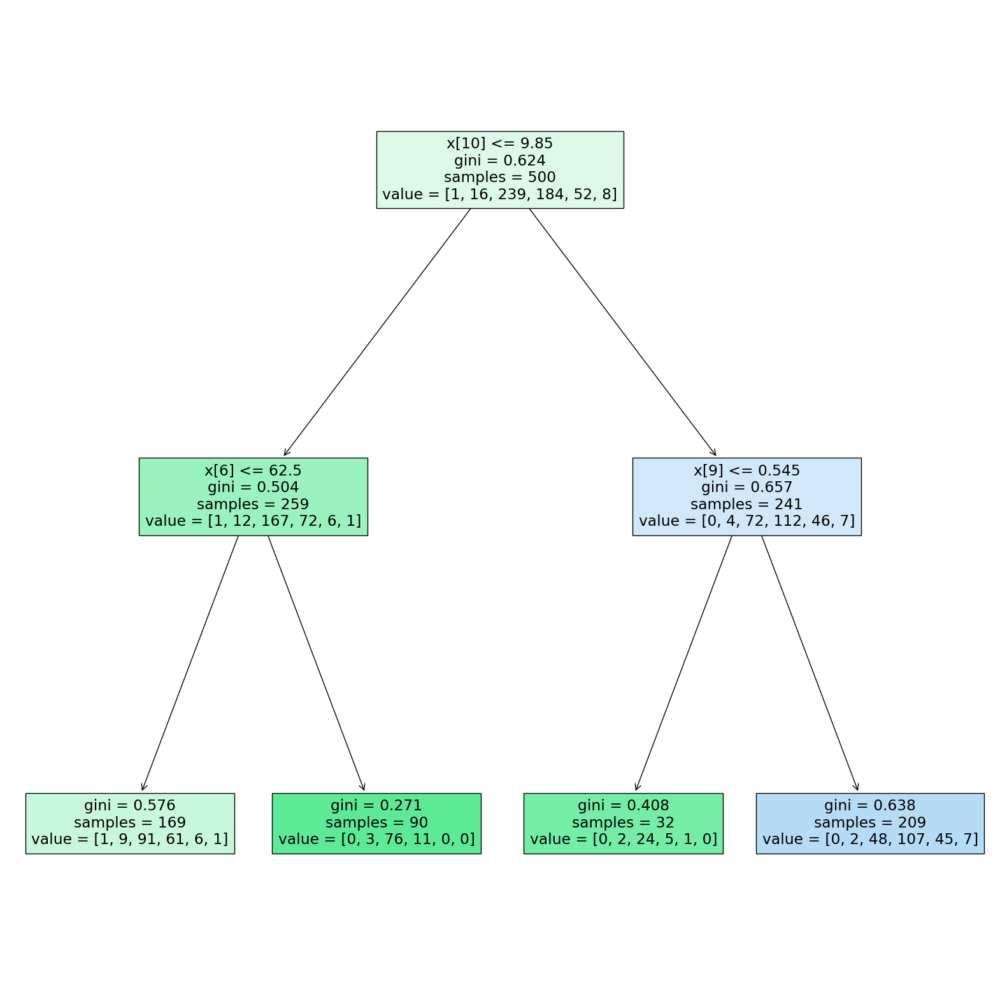

In [40]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [41]:
dt_model_ccp.score(x1,y1)

0.596

In [42]:
dt_model_ccp.score(x_test,y_test)

0.5734375

In [43]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [44]:
grid_param={'criterion':['gini','entropy'],
            'splitter':['best','random'],
            'max_depth':range(2,40,1),
            'min_samples_split':range(2,10,1),
            'min_samples_leaf':range(1,10,1)
}

In [45]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_param, cv=10,n_jobs=-1)

In [46]:
grid_ccp.fit(x1,y1)

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [47]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 17,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'splitter': 'random'}

In [48]:
dt_cpp_new=DecisionTreeClassifier(criterion='entropy',max_depth=17,min_samples_leaf=1,min_samples_split=3,splitter='random',ccp_alpha=0.014)

In [49]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [50]:
dt_cpp_new.score(x1,y1)

0.672

In [51]:
dt_cpp_new.score(x_test,y_test)

0.528125